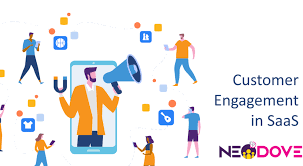

In [1]:
from bubbly.bubbly import bubbleplot
import plotly.express as px
import plotly.offline as py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('customer_churn.csv')
df

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [4]:
#changing bool to string value for visulaization i havent changed it to int
df['churn']=df['churn'].astype(str)

In [5]:
df.dtypes

state                      object
account length              int64
area code                   int64
phone number               object
international plan         object
voice mail plan            object
number vmail messages       int64
total day minutes         float64
total day calls             int64
total day charge          float64
total eve minutes         float64
total eve calls             int64
total eve charge          float64
total night minutes       float64
total night calls           int64
total night charge        float64
total intl minutes        float64
total intl calls            int64
total intl charge         float64
customer service calls      int64
churn                      object
dtype: object

In [6]:
df.isnull().sum()

state                     0
account length            0
area code                 0
phone number              0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

AS YOU CAN SEE THERE ARE NO MISSING VALUES

In [7]:
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


The mean and min has larger difference in account length number vmail messages and 75%,max has larger difference in total int calls

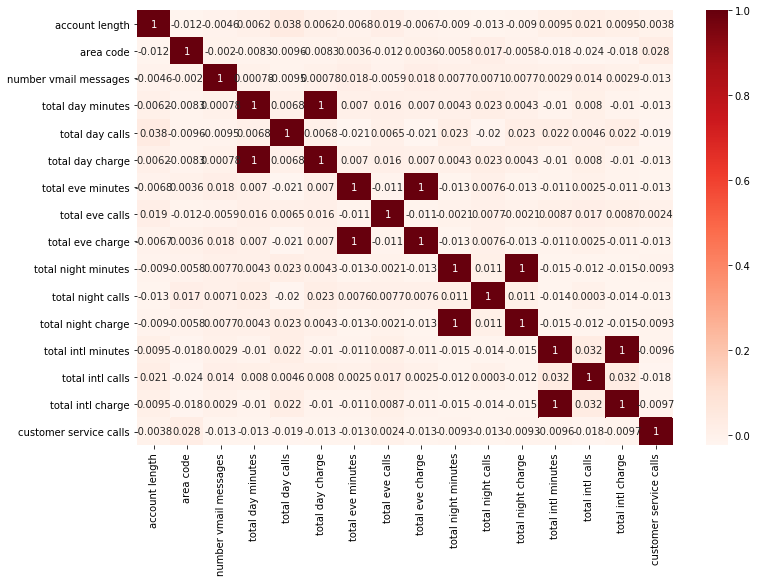

In [8]:
#see correlation
df_cor=df.corr()
plt.figure(figsize=(12,8))
sns.heatmap(df_cor,annot=True,cmap='Reds')
plt.show()

maroon color shows higher correlation where as cream color shows negative correlation 

In [9]:
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

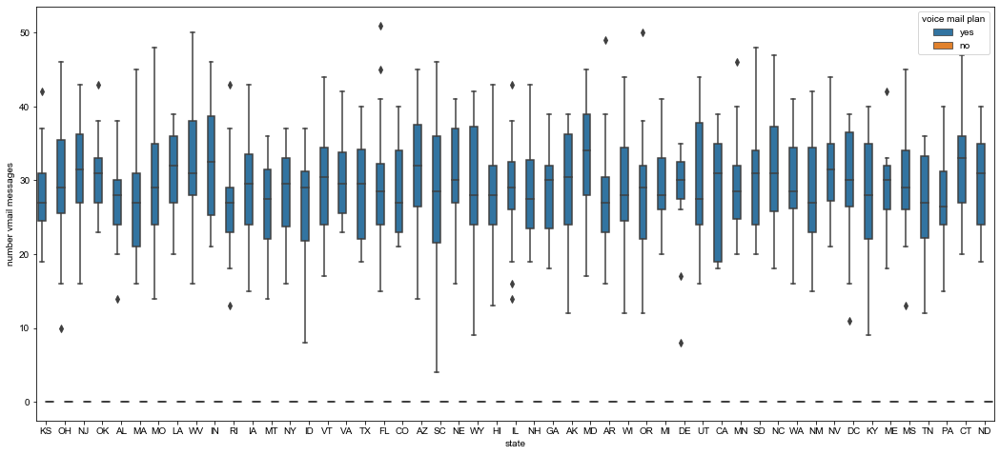

In [10]:
plt.figure(figsize=(18,8))
sns.boxplot(x='state',y='number vmail messages',hue='voice mail plan',data=df)
sns.set(style='whitegrid')
plt.show()

In [11]:
fig=bubbleplot(dataset=df,x_column='total day calls',y_column='total day charge',
               bubble_column='state',
              size_column='total day calls',
              color_column='state',
              x_title='total day calls',y_title='total day charge',title='calls per day to charge',
              x_logscale=False,scale_bubble=1,height=500)
py.iplot(fig,config={'scrollzoom':False})

In [12]:
fig=bubbleplot(dataset=df,x_column='total day minutes',y_column='total day charge',
               bubble_column='state',
              size_column='total day minutes',
              color_column='state',
              x_title='total day minutes',y_title='total day charge',title='minutes per day to charge',
              x_logscale=False,scale_bubble=1,height=500)
py.iplot(fig,config={'scrollzoom':False})

In [13]:
fig=bubbleplot(dataset=df,x_column='total eve calls',y_column='total eve charge',
               bubble_column='state',
              size_column='total eve calls',
              color_column='state',
              x_title='total eve calls',y_title='total eve charge',title='calls per eve to charge',
              x_logscale=False,scale_bubble=1,height=500)
py.iplot(fig,config={'scrollzoom':False})

In [14]:
fig=bubbleplot(dataset=df,x_column='total eve minutes',y_column='total eve charge',
               bubble_column='state',
              size_column='total eve minutes',
              color_column='state',
              x_title='total eve minutes',y_title='total eve charge',title='minutes per eve to charge',
              x_logscale=False,scale_bubble=1,height=500)
py.iplot(fig,config={'scrollzoom':False})

In [15]:
fig=bubbleplot(dataset=df,x_column='total night calls',y_column='total night charge',
               bubble_column='state',
              size_column='total night calls',
              color_column='state',
              x_title='total night calls',y_title='total night charge',title='calls per night to charge',
              x_logscale=False,scale_bubble=1,height=600)
py.iplot(fig,config={'scrollzoom':False})

In [16]:
fig=bubbleplot(dataset=df,x_column='total night minutes',y_column='total night charge',
               bubble_column='state',
              size_column='total night minutes',
              color_column='state',
              x_title='total night minutes',y_title='total night charge',title='minutes per night to charge',
              x_logscale=False,scale_bubble=1,height=600)
py.iplot(fig,config={'scrollzoom':False})

In [17]:
fig=px.scatter_3d(df,x='total intl minutes',y='total intl calls',z='total intl charge',symbol='international plan',size='total intl charge',size_max=18,
                 color='international plan',opacity=0.7)
fig.update_layout(margin=dict(r=0,l=0,b=0,t=0))

In [18]:
fig=px.scatter_3d(df,x='account length',y='area code',z='customer service calls',symbol='churn',size='customer service calls',size_max=18,
                 color='churn',opacity=0.7)
fig.update_layout(margin=dict(r=0,l=0,b=0,t=0))

In [19]:
fig=px.scatter_3d(df,x='total intl minutes',y='total intl calls',z='total intl charge',symbol='churn',size='total intl calls',size_max=18,
                 color='churn',opacity=0.7)
fig.update_layout(margin=dict(r=0,l=0,b=0,t=0))

In [20]:
fig=px.scatter_3d(df,x='total day minutes',y='total day calls',z='total day charge',symbol='churn',size='total day calls',size_max=18,
                 color='churn',opacity=0.7)
fig.update_layout(margin=dict(r=0,l=0,b=0,t=0))

In [21]:
fig=px.scatter_3d(df,x='total eve minutes',y='total eve calls',z='total eve charge',symbol='churn',size='total eve calls',size_max=18,
                 color='churn',opacity=0.7)
fig.update_layout(margin=dict(r=0,l=0,b=0,t=0))

In [22]:
fig=px.scatter_3d(df,x='total night minutes',y='total night calls',z='total night charge',symbol='churn',size='total night calls',size_max=18,
                 color='churn',opacity=0.7)
fig.update_layout(margin=dict(r=0,l=0,b=0,t=0))

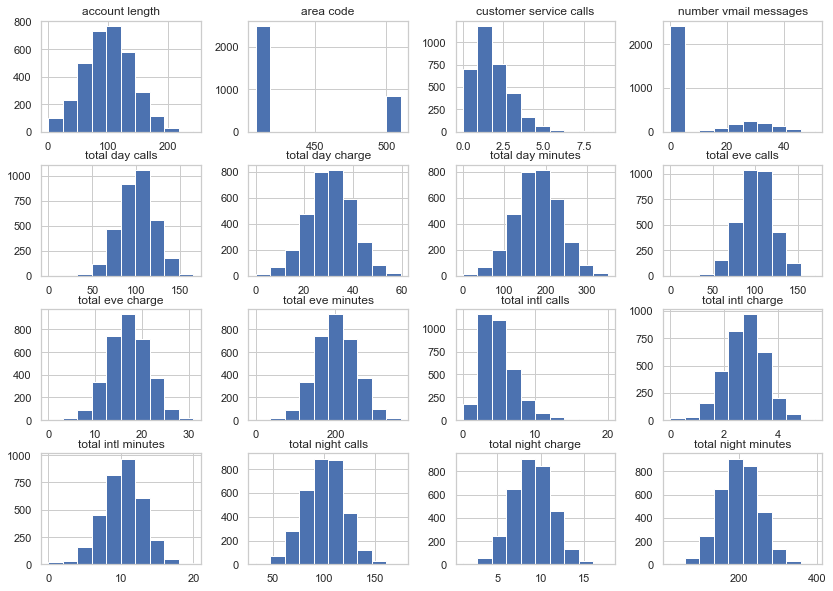

In [23]:
df.hist(figsize=(14,10))
plt.show()

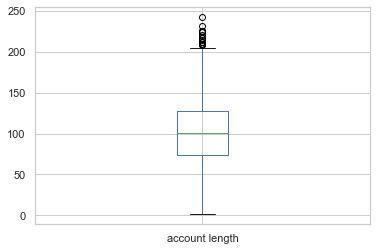

In [24]:
#check outliers
df['account length'].plot.box()
plt.show()

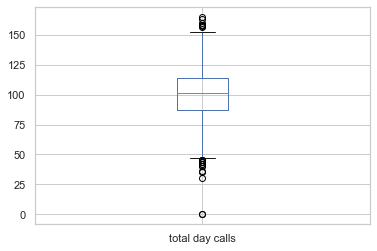

In [25]:
df['total day calls'].plot.box()

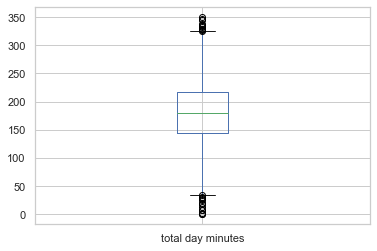

In [26]:
df['total day minutes'].plot.box()

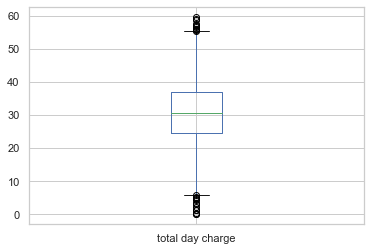

In [27]:
df['total day charge'].plot.box()

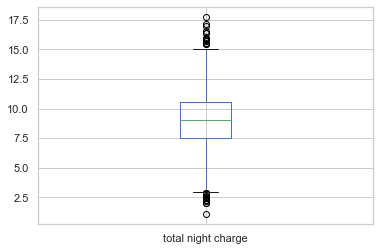

In [28]:
df['total night charge'].plot.box()

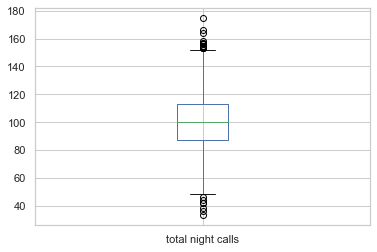

In [29]:
df['total night calls'].plot.box()

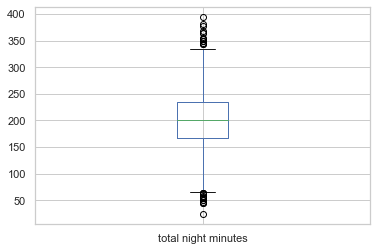

In [30]:
df['total night minutes'].plot.box()

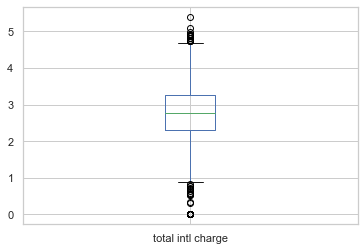

In [31]:
df['total intl charge'].plot.box()

In [32]:
#use label encoder
from sklearn import preprocessing
le=preprocessing.LabelEncoder()
le_count=0
for col in df.columns[1:]:
    if df[col].dtype=='object':
        if len(list(df[col].unique())) <=10:
            le.fit(df[col])
            df[col]=le.transform(df[col])
            le_count +=1
print('{}columns were label encoded.'.format(le_count))

3columns were label encoded.


In [33]:
df.dtypes

state                      object
account length              int64
area code                   int64
phone number               object
international plan          int32
voice mail plan             int32
number vmail messages       int64
total day minutes         float64
total day calls             int64
total day charge          float64
total eve minutes         float64
total eve calls             int64
total eve charge          float64
total night minutes       float64
total night calls           int64
total night charge        float64
total intl minutes        float64
total intl calls            int64
total intl charge         float64
customer service calls      int64
churn                       int32
dtype: object

In [34]:
label=le.fit_transform(df['state'])

In [35]:
df.drop(columns=['state'])
df['state']=label

In [36]:
df=df.drop(columns=['phone number'])

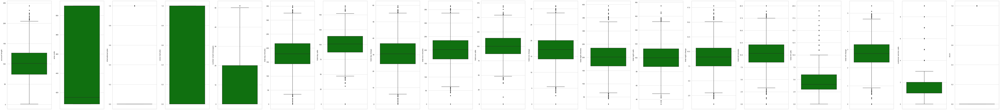

In [37]:
#see outliers at a time
collist=df.columns.values
ncol=21
nrows=20
plt.figure(figsize=(5*ncol,10*ncol))
for i in range(1, len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='green',orient='v')
    plt.tight_layout()

In [38]:
#check skew
df.skew()

state                    -0.064618
account length            0.096606
area code                 1.126823
international plan        2.726332
voice mail plan           0.999140
number vmail messages     1.264824
total day minutes        -0.029077
total day calls          -0.111787
total day charge         -0.029083
total eve minutes        -0.023877
total eve calls          -0.055563
total eve charge         -0.023858
total night minutes       0.008921
total night calls         0.032500
total night charge        0.008886
total intl minutes       -0.245136
total intl calls          1.321478
total intl charge        -0.245287
customer service calls    1.091359
churn                     2.018356
dtype: float64

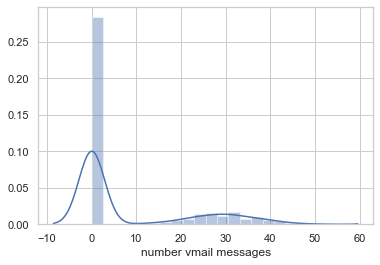

In [39]:
sns.distplot(df['number vmail messages'])

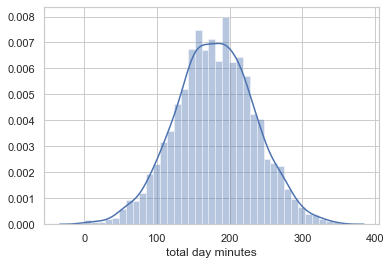

In [40]:
sns.distplot(df['total day minutes'])

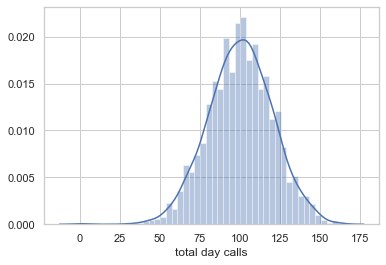

In [41]:
sns.distplot(df['total day calls'])

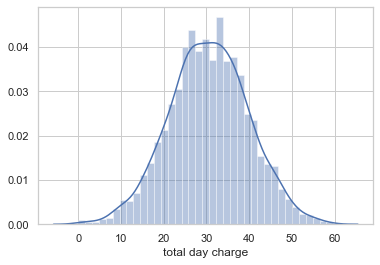

In [42]:
sns.distplot(df['total day charge'])

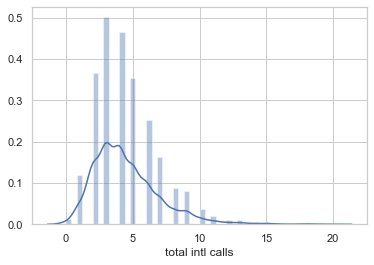

In [43]:
sns.distplot(df['total intl calls'])

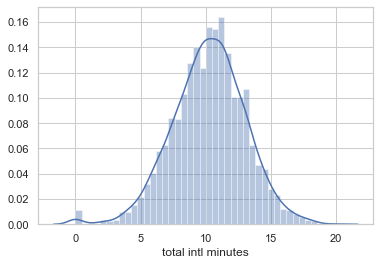

In [44]:
sns.distplot(df['total intl minutes'])

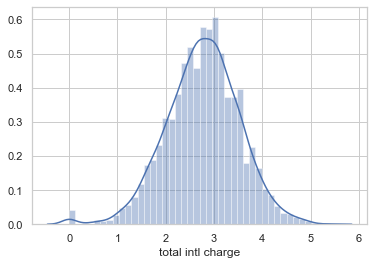

In [46]:
sns.distplot(df['total intl charge'])

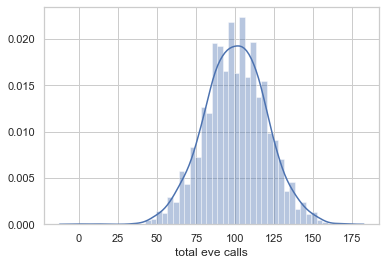

In [47]:
sns.distplot(df['total eve calls'])

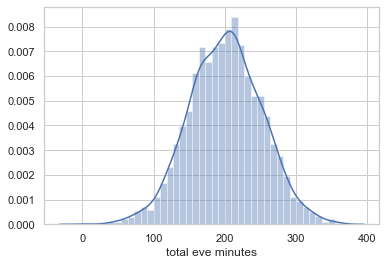

In [49]:
sns.distplot(df['total eve minutes'])

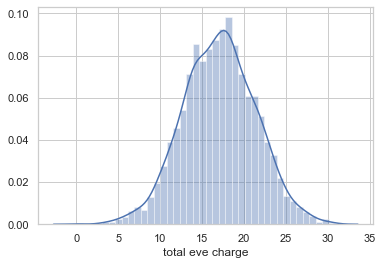

In [50]:
sns.distplot(df['total eve charge'])

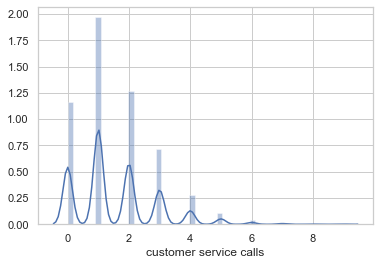

In [51]:
sns.distplot(df['customer service calls'])

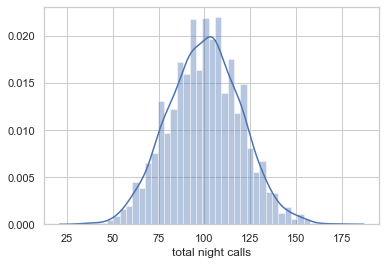

In [52]:
sns.distplot(df['total night calls'])

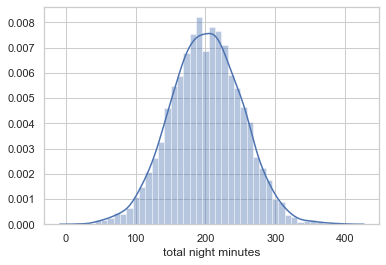

In [53]:
sns.distplot(df['total night minutes'])

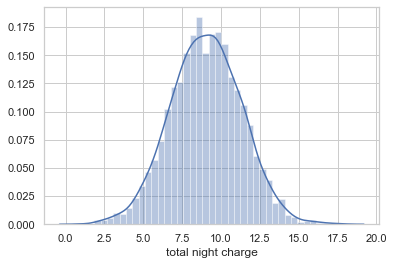

In [54]:
sns.distplot(df['total night charge'])

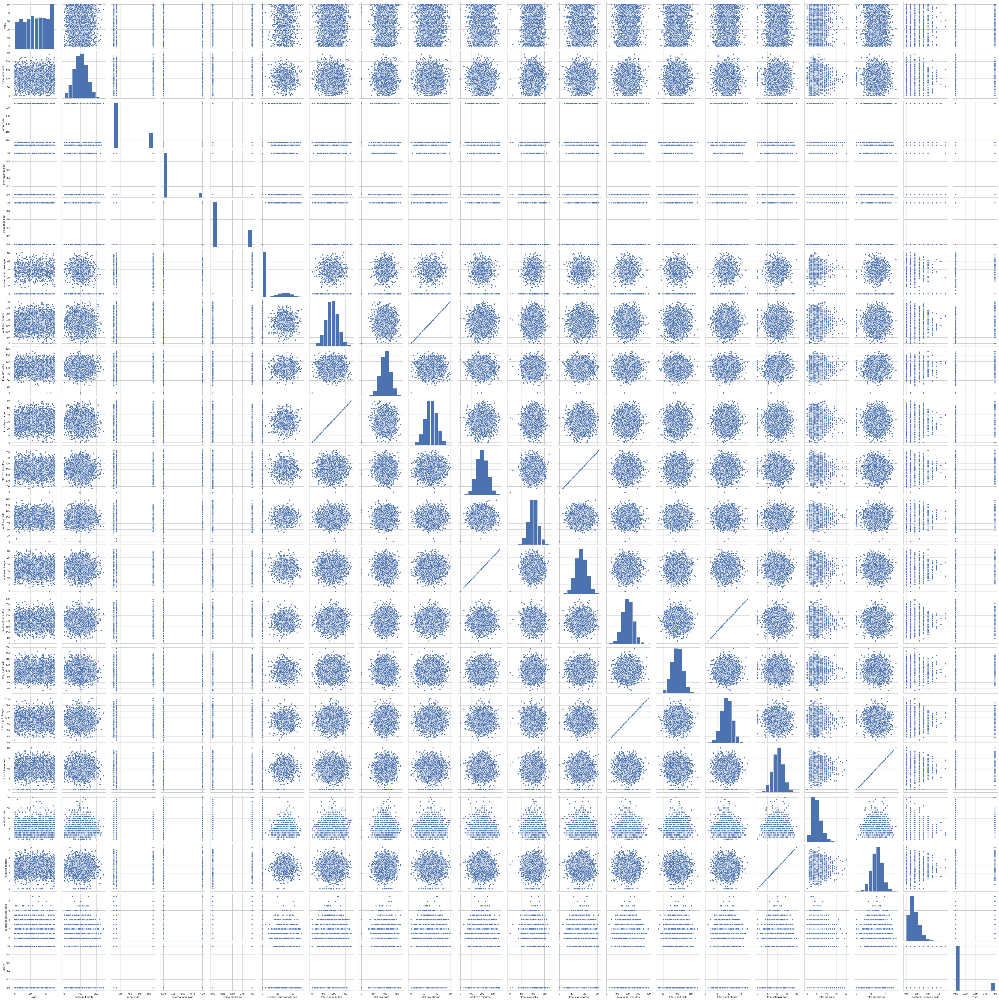

In [56]:
sns.pairplot(df,size=3)
plt.show()

In [57]:
#REMOVING OUTLIERS
from scipy.stats import zscore
z=np.abs(zscore(df))
z

array([[0.6786493 , 0.67648946, 0.52360328, ..., 0.0856905 , 0.42793202,
        0.41167182],
       [0.6031696 , 0.14906505, 0.52360328, ..., 1.2411686 , 0.42793202,
        0.41167182],
       [0.33331299, 0.9025285 , 0.52360328, ..., 0.69715637, 1.1882185 ,
        0.41167182],
       ...,
       [0.87302621, 1.83505538, 1.71881732, ..., 1.3871231 , 0.33235445,
        0.41167182],
       [1.35329082, 2.08295458, 1.71881732, ..., 1.87695028, 0.33235445,
        0.41167182],
       [1.07541867, 0.67974475, 0.52360328, ..., 1.2411686 , 1.1882185 ,
        0.41167182]])

In [58]:
Threshold=3
print(np.where(z>3))

(array([   3,    4,    5,    7,    9,   22,   32,   32,   38,   41,   41,
         58,   66,   67,   81,  115,  115,  115,  135,  144,  147,  179,
        179,  180,  182,  184,  185,  198,  211,  214,  219,  230,  231,
        234,  241,  244,  244,  254,  258,  269,  272,  276,  279,  301,
        314,  314,  319,  329,  332,  343,  343,  351,  354,  356,  358,
        360,  365,  365,  372,  377,  378,  382,  383,  405,  408,  416,
        416,  425,  444,  465,  468,  474,  483,  486,  488,  488,  491,
        492,  493,  495,  498,  502,  503,  504,  514,  514,  522,  529,
        533,  533,  542,  542,  546,  547,  553,  567,  569,  572,  586,
        595,  595,  601,  613,  616,  619,  626,  636,  642,  646,  674,
        679,  692,  694,  708,  712,  712,  715,  716,  721,  734,  735,
        737,  740,  749,  756,  762,  762,  762,  766,  771,  773,  777,
        778,  779,  780,  781,  783,  790,  792,  797,  808,  817,  821,
        821,  826,  830,  837,  837,  842,  845,  

In [59]:
z[3][3]

3.0526849573639936

In [60]:
df_new=df[(z<3).all(axis=1)]
df_new

,state,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,16,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
6,19,121,510,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0
8,18,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3327,40,79,415,0,0,0,134.7,98,22.90,189.7,68,16.12,221.4,128,9.96,11.8,5,3.19,2,0
3328,3,192,415,0,1,36,156.2,77,26.55,215.5,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0
3329,49,68,415,0,0,0,231.1,57,39.29,153.4,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0
3330,39,28,510,0,0,0,180.8,109,30.74,288.8,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0


In [61]:
print(df_new.shape,df.shape)

(2860, 20) (3333, 20)


In [62]:
df=df_new

In [63]:
df.shape

(2860, 20)

473 outliers are removed

In [64]:
#splitting data
x=df.iloc[:,:-1]
x.head()

,state,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
0,16,128,415,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,35,107,415,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,31,137,415,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
6,19,121,510,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3
8,18,117,408,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1


In [65]:
y=df.iloc[:,19:]
y.head()

,churn
0,0
1,0
2,0
6,0
8,0


In [66]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)
x

array([[-0.67671951,  0.6918089 , -0.51733431, ..., -0.63486297,
        -0.10514247, -0.42850301],
       [ 0.60505881,  0.16209737, -0.51733431, ..., -0.63486297,
         1.279394  , -0.42850301],
       [ 0.33521074,  0.91882812, -0.51733431, ...,  0.29483908,
         0.71173405, -1.25488102],
       ...,
       [ 1.54952704, -0.82165261, -0.51733431, ..., -0.17001195,
        -0.25744149,  1.22425303],
       [ 0.87490687, -1.83062694,  1.73612833, ...,  0.7596901 ,
         1.43169301,  0.39787501],
       [ 1.07729293, -0.67030646, -0.51733431, ..., -0.17001195,
         1.279394  , -1.25488102]])

In [67]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,auc
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

In [68]:
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=9,test_size=0.3,stratify=y)

In [69]:
print(x_train.shape,x_test.shape)
print(y_train.shape,y_test.shape)

(2002, 19) (858, 19)
(2002, 1) (858, 1)


In [70]:
knn=KNeighborsClassifier()
dt=DecisionTreeClassifier(random_state=6)
sv=SVC()
lr=LogisticRegression()
gn=GaussianNB()

In [71]:
models = []
models.append(('KNneighborsClassifier',knn))
models.append(('DecisionTreeClassifier',dt))
models.append(('SVC',sv))
models.append(('LogisticRegression',lr))
models.append(('GaussianNB',gn))

*************************** KNneighborsClassifier ***************************


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')


AccuracyScore= 0.9230769230769231


cross_val_score= 0.918881118881119


roc_auc_score= 0.6536008688871561


classification_report
               precision    recall  f1-score   support

           0       0.92      1.00      0.96       764
           1       0.97      0.31      0.47        94

    accuracy                           0.92       858
   macro avg       0.94      0.65      0.71       858
weighted avg       0.93      0.92      0.90       858



[[763   1]
 [ 65  29]]


AxesSubplot(0.125,0.808774;0.62x0.0712264)



*************************** DecisionTreeClassifier ***************************


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_

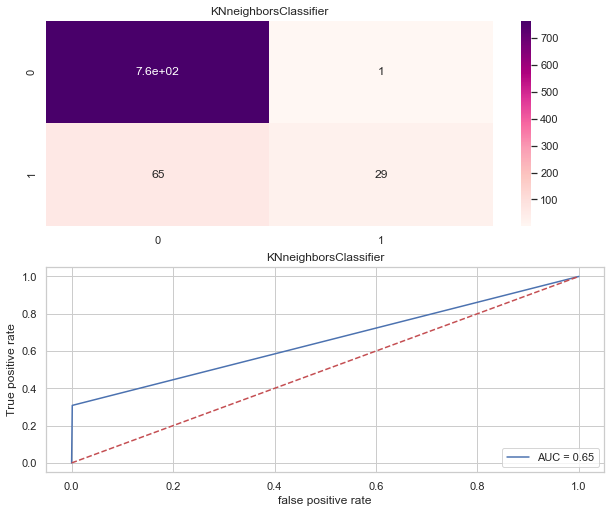

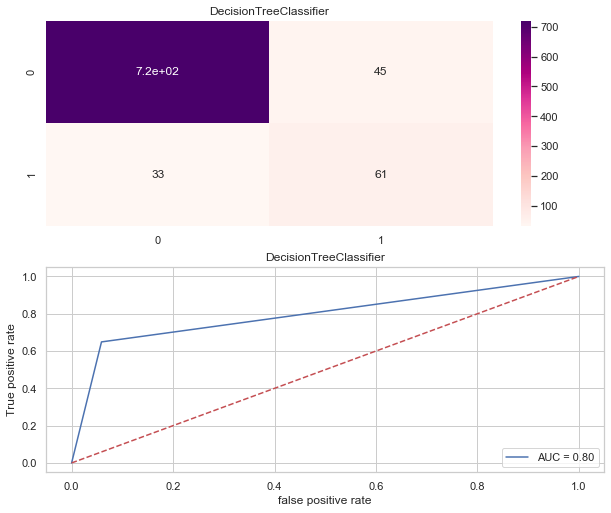

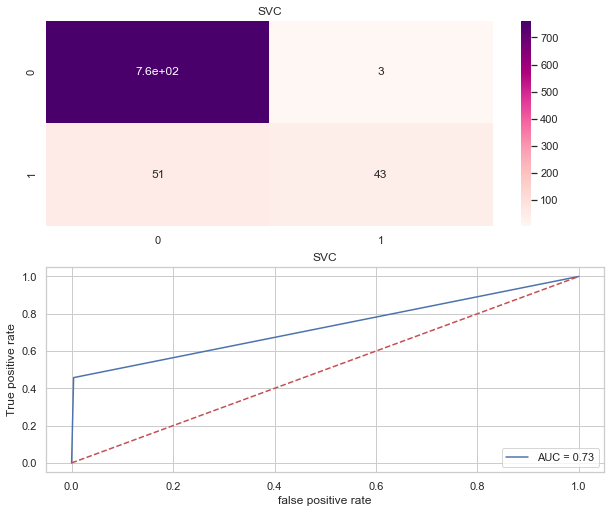

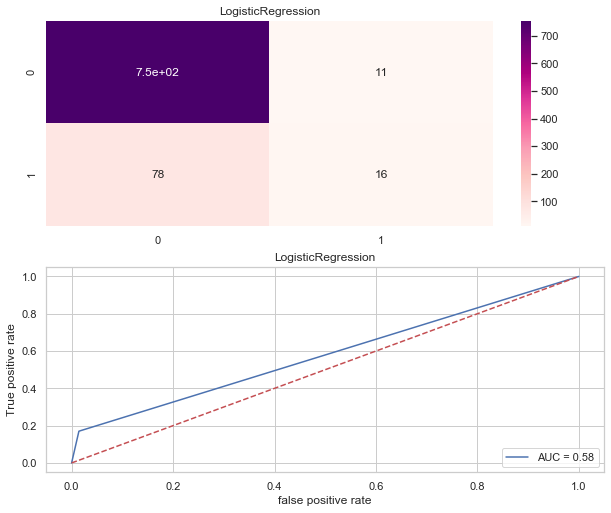

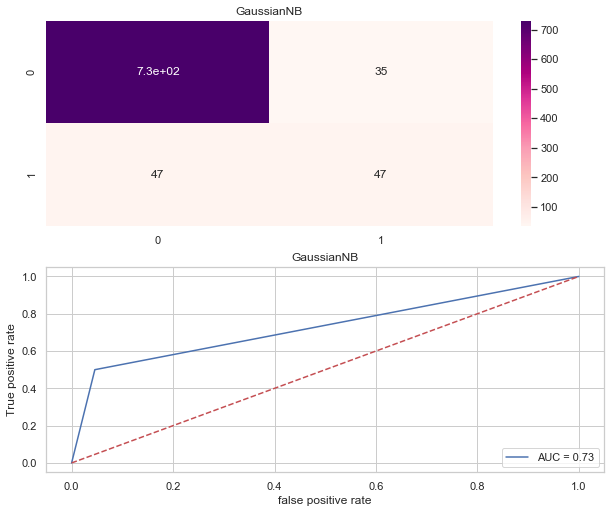

In [73]:
Model = []
score = []
cvs = []
rocscore=[]
for name,model in models:
    print('***************************',name,'***************************')
    print('\n')
    Model.append(name)
    model.fit(x_train,y_train)
    print(model)
    pre=model.predict(x_test)
    print('\n')
    AS=accuracy_score(y_test,pre)
    print('AccuracyScore=',AS)
    score.append(AS*100)
    print('\n')
    sc=cross_val_score(model,x,y,cv=10,scoring='accuracy').mean()
    print('cross_val_score=',sc)
    cvs.append(sc*100)
    print('\n')
    false_positive_rate,true_positive_rate,thresholds = roc_curve(y_test,pre)
    roc_auc=auc(false_positive_rate,true_positive_rate)
    print('roc_auc_score=',roc_auc)
    rocscore.append(roc_auc*100)
    print('\n')
    print('classification_report\n',classification_report(y_test,pre))
    print('\n')
    cm=confusion_matrix(y_test,pre)
    print(cm)
    print('\n')
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print(sns.heatmap(cm,annot=True,cmap='RdPu'))
    plt.subplot(912)
    plt.title(name)
    plt.plot(false_positive_rate,true_positive_rate,label='AUC = %0.2f'% roc_auc)
    plt.plot([0,1],[0,1],'r--')
    plt.legend(loc='lower right')
    plt.ylabel('True positive rate')
    plt.xlabel('false positive rate')
    print('\n\n')

In [74]:
result=pd.DataFrame({'Model':Model,'Accuracy_score':score,'Cross_val_score':cvs,'roc_auc_curve':rocscore})
result

,Model,Accuracy_score,Cross_val_score,roc_auc_curve
0,KNneighborsClassifier,92.307692,91.888112,65.360087
1,DecisionTreeClassifier,90.909091,91.538462,79.501782
2,SVC,93.706294,93.916084,72.676005
3,LogisticRegression,89.627040,89.930070,57.790743
4,GaussianNB,90.442890,91.993007,72.709424


here i choose svc it shows good accuracy score and cross val score followed by decision tree classifier

In [75]:
from sklearn.model_selection import GridSearchCV

In [76]:
from sklearn.tree import DecisionTreeClassifier
dtc=DecisionTreeClassifier()
grid_param={
    'criterion': ['gini','entropy']
}
gd_sr=GridSearchCV(estimator=dtc,
                   param_grid=grid_param,
                  scoring='accuracy',
                  cv=10)
gd_sr.fit(x,y)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'criterion': 'entropy'}
0.9178321678321678


In [77]:
sv=SVC()
grid_param={
    'kernel': ['rbf','linear','poly']
}
gd_sr=GridSearchCV(estimator=sv,
                   param_grid=grid_param,
                  scoring='accuracy',
                  cv=10)
gd_sr.fit(x,y)

best_parameters=gd_sr.best_params_
print(best_parameters)
best_result=gd_sr.best_score_
print(best_result)

{'kernel': 'rbf'}
0.9391608391608394


after tuning parameters for svc and decision tree the score get improved by 1

In [78]:
#PREDICT THE VALUES
pred=lr.predict(x_test)
print('predicted result:',pre)
print('actual:',y_test)

predicted result: [0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 

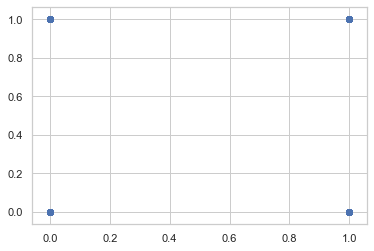

In [79]:
print(plt.scatter(x=y_test,y=pre))
plt.show()

In [80]:
from joblib import dump,load
dump(df,'customer_churn_project.joblib')

['customer_churn_project.joblib']